# Style Transfer of MRI Images: T1 to T2 and vice-versa

### By: Siddhant Pattanaik

## Problem statement: 
To build a Generative adversarial model(modified U-Net) which can generate artificial MRI images of different contrast levels from existing MRI scans.

#### Background
Misdiagnosis in the medical field is a very serious issue but it’s also uncomfortably common to occur. Imaging procedures in the medical field requires an expert radiologist’s opinion since interpreting them is not a simple binary process ( Normal or Abnormal). Even so, one radiologist may see something that another does not. This can lead to conflicting reports and make it difficult to effectively recommend treatment options to the patient.

One of the complicated tasks in medical imaging is to diagnose MRI(Magnetic Resonance Imaging). Sometimes to interpret the scan, the radiologist needs different variations of the imaging which can drastically enhance the accuracy of diagnosis by providing practitioners with a more comprehensive understanding.

But to have access to different imaging is difficult and expensive. With the help of deep learning, we can use style transfer to generate artificial MRI images of different contrast levels from existing MRI scans. This will help to provide a better diagnosis with the help of an additional image.

In this project, CycleGAN has been used to translate the style of one MRI image to another, which will help in a better understanding of the scanned image. Using GANs, T2 weighted images are generated from T1 weighted MRI image and vice-versa.

## Pipeline

1. Data Understanding
  - Basic EDA
  - Data loading
  - Sample data visualization
2. Image Processing
  - Data normalization
  - Data resizing
  - Data reshaping
  - Batch and shuffling of data
3. Model-Building and Training

In [1]:
# Importing required libraries
import numpy as np
import tensorflow as tf

import matplotlib.pyplot as plt
import imageio
import cv2
import os
import glob
import pathlib

from tensorflow import keras
from tensorflow.keras import layers, Sequential
from tensorflow.keras.utils import image_dataset_from_directory
from tensorflow.keras.utils import plot_model
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization, Activation, Flatten, Conv2D, Conv2DTranspose
from keras.utils.vis_utils import plot_model

In [2]:
#Google Colab set up - Use if using Google Colab
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [3]:
# Defining the path for the data
base_dir = pathlib.Path("/content/gdrive/My Drive/Colab Notebooks/Capstone_T1_T2_CycleGAN")
os.chdir(base_dir)

data_dir_T1 = pathlib.Path(str(base_dir) + "/Data/T1")
data_dir_T2 = pathlib.Path(str(base_dir) + "/Data/T2")

print("Path for T1 data :\n", data_dir_T1)
print("Path for T2 data :\n", data_dir_T2)

Path for T1 data :
 /content/gdrive/My Drive/Colab Notebooks/Capstone_T1_T2_CycleGAN/Data/T1
Path for T2 data :
 /content/gdrive/My Drive/Colab Notebooks/Capstone_T1_T2_CycleGAN/Data/T2


## Data Understanding

### Basic EDA

In [4]:
# Reading sample image to check dimension
sample = cv2.imread(str(data_dir_T1)+"/Image #10.png")
sample.shape

(217, 181, 3)

In [5]:
image_count_T1 = len(list(data_dir_T1.glob('*.png')))
print("No. of images in T1 dataset: ", image_count_T1)
image_count_T2 = len(list(data_dir_T2.glob('*.png')))
print("No. of images in T2 dataset: ", image_count_T2)

No. of images in T1 dataset:  43
No. of images in T2 dataset:  46


In [6]:
# Setting input image sizes 
IMG_HEIGHT = 217
IMG_WIDTH = 181

In [7]:
# Setting default batch size 
BATCH_SIZE = 64

### Data Loading

In [8]:
# Loading T1 images
images_T1 = image_dataset_from_directory(data_dir_T1, seed = 123, shuffle = True, labels = None,
                                         image_size=(IMG_HEIGHT, IMG_WIDTH), batch_size=BATCH_SIZE)

Found 43 files belonging to 1 classes.


In [9]:
# loading T2 images
images_T2 = image_dataset_from_directory(data_dir_T2, seed = 123, shuffle = True, labels = None,
                                         image_size=(IMG_HEIGHT, IMG_WIDTH), batch_size=BATCH_SIZE)

Found 46 files belonging to 1 classes.


### Data Visualization

T1 data examples


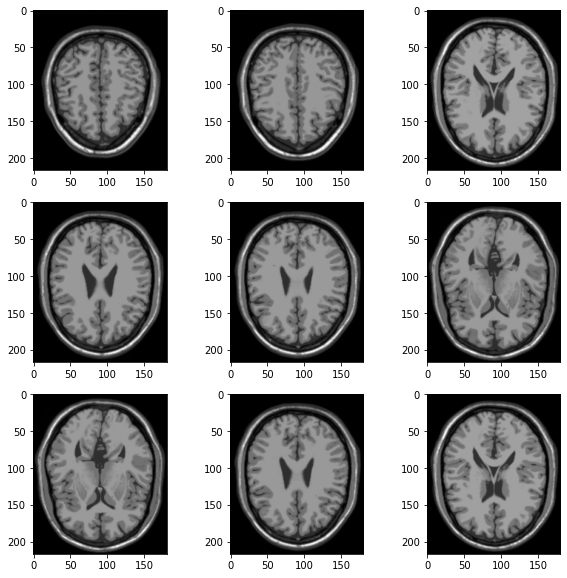

In [10]:
# Visualizing data from T1 dataset
plt.figure(figsize=(10, 10))
for images in images_T1.take(1):
  print("T1 data examples")
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))

T2 data examples



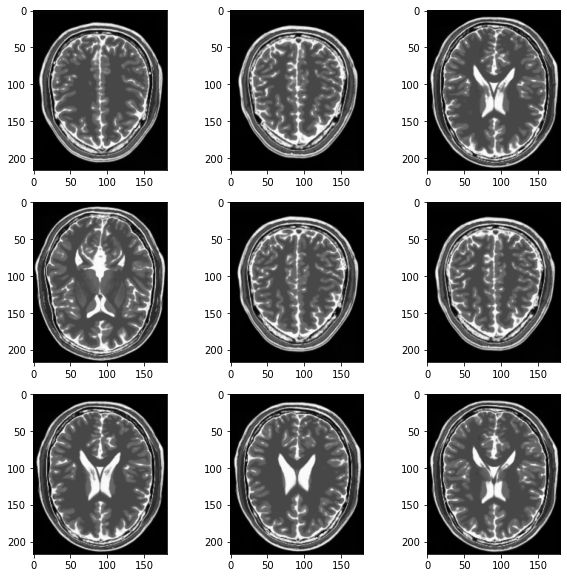

In [11]:
# Visualizing data from T2 dataset
plt.figure(figsize=(10, 10))
for images in images_T2.take(1):
  print("T2 data examples\n")
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))

In [12]:
# Checking range of values of the pixels making up the image in T1 data
image_batch = next(iter(images_T1))
first_image = image_batch[0]
print("T1 data pixel value range: ", np.min(first_image), np.max(first_image))

T1 data pixel value range:  0.0 255.0


In [13]:
# Checking range of values of the pixels making up the image in T2 data
image_batch = next(iter(images_T2))
first_image = image_batch[0]
print("T2 data pixel value range: ", np.min(first_image), np.max(first_image))

T2 data pixel value range:  0.0 255.0


## Data Preprocessing
1. Data Normalization
2. Data Resizing
3. Data Reshaping
4. Batch and Shuffle Data

### Data Normalization

In [14]:
# Define normalization function - Normalizing data in the range [-1.0, 1.0]
normalization_layer = layers.experimental.preprocessing.Rescaling(scale = 1./127.5, offset =-1.0)

In [15]:
# Normalizing T1 data
images_T1_norm = images_T1.map(lambda x: (normalization_layer(x)))
image_batch1 = next(iter(images_T1_norm))
first_image = image_batch1[0]
print("Minimum and maximum pixel values after normalization")
print(np.min(first_image), np.max(first_image))

Minimum and maximum pixel values after normalization
-1.0 1.0


In [16]:
images_T1_batch  = next(iter(images_T1_norm))
images_T1_batch.shape

TensorShape([43, 217, 181, 3])

T1 data examples after normalization


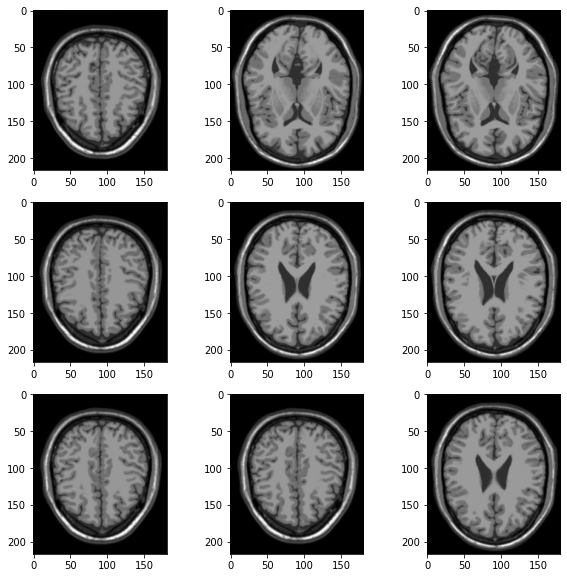

In [17]:
# Visualizing data from T1 dataset after normalization
plt.figure(figsize=(10, 10))
for images in images_T1_norm.take(1):
  print("T1 data examples after normalization")
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow((images[i] * 127.5 + 127.5).numpy().astype("uint8"))   # Reversing the scaling for visualization

In [18]:
# Normalizing T2 data
images_T2_norm = images_T2.map(lambda x: (normalization_layer(x)))
image_batch2 = next(iter(images_T2_norm))
first_image = image_batch2[0]
print("Minimum and maximum pixel values after normalization")
print(np.min(first_image), np.max(first_image))

Minimum and maximum pixel values after normalization
-1.0 1.0


In [19]:
images_T2_batch  = next(iter(images_T2_norm))
images_T2_batch.shape

TensorShape([46, 217, 181, 3])

T2 data examples after normalization


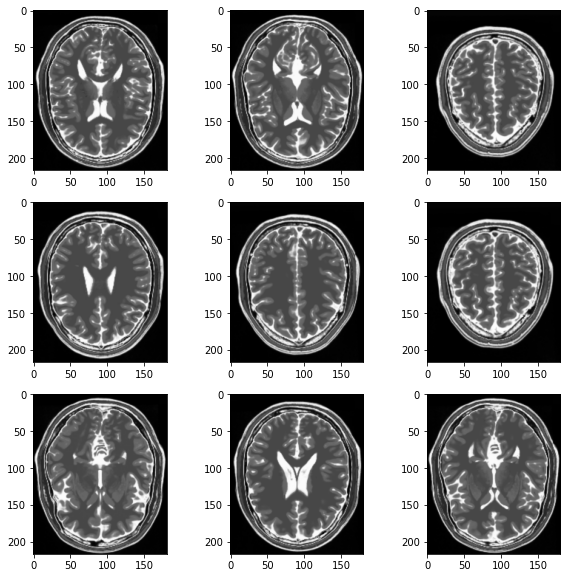

In [20]:
# Visualizing data from T2 dataset after normalization
plt.figure(figsize=(10, 10))
for images in images_T2_norm.take(1):
  print("T2 data examples after normalization")
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow((images[i] * 127.5 + 127.5).numpy().astype("uint8"))   # Reversing the scaling for visualization

### Data Resizing to (128,128)

- Resizing to a dimensions with a power of 2 allows optimal usage of memory.

In [21]:
# Define resizing function
resize_layer = layers.experimental.preprocessing.Resizing(128, 128, interpolation='bilinear')

Shape of resized images:  (128, 128, 3) 



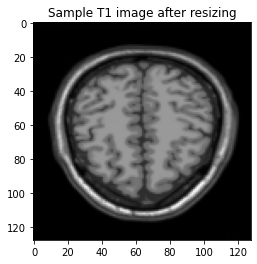

In [22]:
# Resizing T1 data
images_T1_resized = images_T1_norm.map(lambda x: (resize_layer(x)))

# Obtaining a batch of T1 data.
image_batch = next(iter(images_T1_resized))
first_image = image_batch[0]
print("Shape of resized images: ",first_image.shape,"\n")

# Plotting the first image in the batch of T1 data.
plt.imshow((first_image * 127.5 + 127.5).numpy().astype("uint8"))   # Reversing the scaling for visualization
plt.title("Sample T1 image after resizing")
plt.show()

Shape of resized images:  (128, 128, 3) 



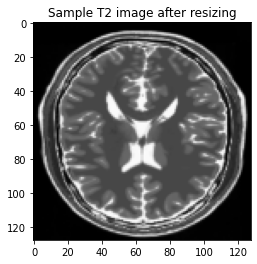

In [23]:
# Resizing T2 data
images_T2_resized = images_T2_norm.map(lambda x: (resize_layer(x)))

# Obtaining a batch of T2 data.
image_batch = next(iter(images_T2_resized))
first_image = image_batch[0]
print("Shape of resized images: ",first_image.shape,"\n")

# Plotting the first image in the batch of T2 data.
plt.imshow((first_image * 127.5 + 127.5).numpy().astype("uint8"))   # Reversing the scaling for visualization
plt.title("Sample T2 image after resizing")
plt.show()

### Reshape the data to a single channel

Since the MRI images are grayscale in nature, a single channel of data is sufficient to extract all the information we need. Keeping the data in RGB format is unnecessary and will only increase the training times.

In [24]:
reshape_layer = layers.Reshape((128,128,1))

(43, 128, 128, 1)
Shape of reshaped images:  (128, 128, 1) 



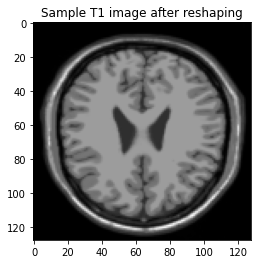

In [25]:
images_T1_reshaped = images_T1_resized.map(lambda x : reshape_layer(x[:,:,:,0]))

image_batch = next(iter(images_T1_reshaped))
print(image_batch.shape)
first_image = image_batch[0]
print("Shape of reshaped images: ",first_image.shape,"\n")

# Plotting the first image in the batch of T1 data.
plt.imshow(first_image.numpy()[:, :, 0], cmap='gray')
plt.title("Sample T1 image after reshaping")
plt.show()

(46, 128, 128, 1)
Shape of reshaped images:  (128, 128, 1) 



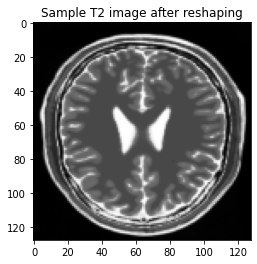

In [26]:
images_T2_reshaped = images_T2_resized.map(lambda x : reshape_layer(x[:,:,:,0]))

image_batch = next(iter(images_T2_reshaped))
print(image_batch.shape)
first_image = image_batch[0]
print("Shape of reshaped images: ",first_image.shape,"\n")

# Plotting the first image in the batch of T1 data.
plt.imshow(first_image.numpy()[:, :, 0], cmap='gray')
plt.title("Sample T2 image after reshaping")
plt.show()

### Batch and reshuffle data

- Shuffling the data to remove any continuity bias 
- The data already exists as a batch since the number of images is relatively small. We consider the entire dataset for each type as a batch for that type.

In [27]:
# A buffer size higher than the number of data samples allows effective shuffling
BUFFER_SIZE = 64

In [28]:
# Shuffling the data
T1_data = images_T1_reshaped.shuffle(BUFFER_SIZE)
T2_data = images_T2_reshaped.shuffle(BUFFER_SIZE)

Shape of T1 image batch:  (43, 128, 128, 1)
Shape of individual images:  (128, 128, 1) 



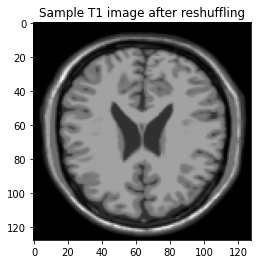

In [29]:
# Obtaining a batch of T1 data.
image_batch = next(iter(T1_data))
print("Shape of T1 image batch: ", image_batch.shape)
first_image = image_batch[0]
print("Shape of individual images: ",first_image.shape,"\n")

# Plotting the first image in the batch of T1 data.
plt.imshow(first_image.numpy()[:, :, 0], cmap='gray')
plt.title("Sample T1 image after reshuffling")
plt.show()

Shape of T2 image batch:  (46, 128, 128, 1)
Shape of individual images:  (128, 128, 1) 



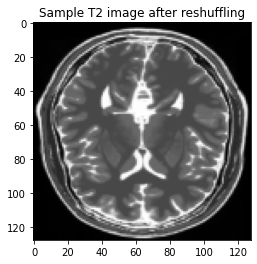

In [30]:
# Obtaining a batch of T2 data.
image_batch = next(iter(T2_data))
print("Shape of T2 image batch: ", image_batch.shape)
first_image = image_batch[0]
print("Shape of individual images: ",first_image.shape,"\n")

# Plotting the first image in the batch of T2 data.
plt.imshow(first_image.numpy()[:, :, 0], cmap='gray')
plt.title("Sample T2 image after reshuffling")
plt.show()

## Model Building
1. Instance Normalization
2. Downsampling, Upsampling and Unet
3. Generator Building using Unet
4. Discriminator Building

### Instance Normalization

Instance Normalization are specially used with Style Transfer, where Separate Normalization is performed for each sample we perform channelwise Normalization.


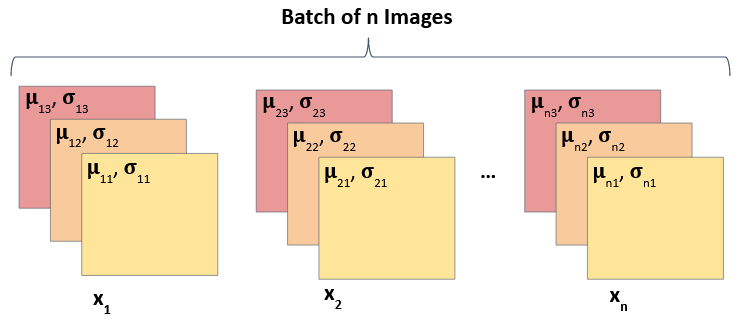

In [31]:
class InstanceNormalization(tf.keras.layers.Layer):
    # Initialization of Objects
    def __init__(self, epsilon=1e-5):
        # calling parent's init
        super(InstanceNormalization, self).__init__()
        self.epsilon = epsilon
    
    def build(self, input_shape):
        self.scale = self.add_weight(
            name='scale',
            shape=input_shape[-1:],
            initializer=tf.random_normal_initializer(1., 0.02),
            trainable=True)
        self.offset = self.add_weight(
            name='offset',
            shape=input_shape[-1:],
            initializer='zeros',
            trainable=True)
    
    def call(self, x):
        # Compute Mean and Variance, Axes=[1,2] ensures Instance Normalization
        mean, variance = tf.nn.moments(x, axes=[1, 2], keepdims=True)
        inv = tf.math.rsqrt(variance + self.epsilon)
        normalized = (x - mean) * inv
        return self.scale * normalized + self.offset

### Downsampling
- Uses Conv2D layers
- Reduces the dimension with each new layer

In [32]:
def downsample(filters, size, apply_norm=True):
    initializer = tf.random_normal_initializer(0., 0.02)
    result = tf.keras.Sequential()
    # Add Conv2d layer
    result.add(tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                                      kernel_initializer=initializer, use_bias=False))
    # Add Normalization layer
    if apply_norm:
        result.add(InstanceNormalization())
    # Add Leaky Relu Activation
    result.add(tf.keras.layers.LeakyReLU())
    return result

### Upsampling

- Uses Transposed Convolution layers
- Increases the dimensions

In [33]:
def upsample(filters, size, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)
    result = tf.keras.Sequential()
    # Add Transposed Conv2d layer
    result.add(tf.keras.layers.Conv2DTranspose(filters, size, strides=2, padding='same',
                                               kernel_initializer=initializer, use_bias=False))
    # Add Normalization Layer
    result.add(InstanceNormalization())
    # Conditionally add Dropout layer
    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.5))
    # Add Relu Activation Layer
    result.add(tf.keras.layers.ReLU())
    return result

### Unets
- Unets take images as input and translate it into another Image. <p>
- To do this they first use Downsampling on Input Image to learn the latent characteristics of input image and then use Upsampling to use this knowledge to translate it into another image. <p>
- The last layer in the downsampling process is the bottleneck layer. <p>
- Each downsampling layer (except the bottleneck layer) has a corresponding upsampling layer. <p>
- An important characteristic is the use of skip connections, which retain the background information from the downsampling layers and transfer them to the corresponding upsampling layer. Bottleneck layer, obviously, has no skip connections.


<center>

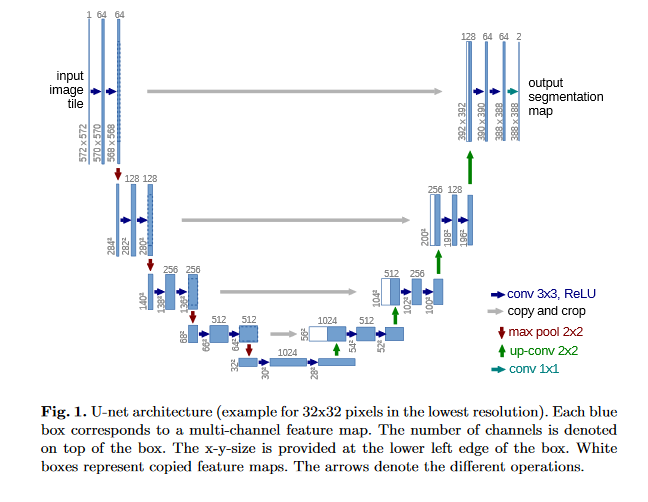

</center>

In [34]:
# Unet Generator is a combination of Convolution + Transposed Convolution Layers
def unet_generator():
    down_stack = [
        downsample(64, 4, True), # (bs, 64, 64, 64)
        downsample(64, 4),        # (bs, 32, 32, 64)
        downsample(128, 4),       # (bs, 16, 16, 128)
        downsample(128, 4),       # (bs, 8, 8, 128)
        downsample(256, 4),       # (bs, 4, 4, 256)
        downsample(256, 4),       # (bs, 2, 2, 256)
        downsample(512, 4)        # Bottleneck layer (bs, 1, 1, 512)
    ]
    up_stack = [
        upsample(256, 4, True),   # (bs, 2, 2, 256)
        upsample(256, 4),         # (bs, 4, 4, 256)
        upsample(128, 4),         # (bs, 8, 8, 128)
        upsample(128, 4),         # (bs, 16, 16,128)
        upsample(64, 4),          # (bs, 32, 32, 64)
        upsample(64, 4)           # (bs, 64, 64, 64)
    ]
    initializer = tf.random_normal_initializer(0., 0.02)
    last = tf.keras.layers.Conv2DTranspose(1, 4, strides=2, padding='same', kernel_initializer=initializer,
                                           activation='tanh') # (bs, 128, 128, 1)
    
    # Apply skip connections
    concat = tf.keras.layers.Concatenate()
    inputs = tf.keras.layers.Input(shape=[128, 128, 1])
    x = inputs
    
    # Downsampling through the model
    skips = []                # List to store downsampling layers' latent information
    for down in down_stack:
        x = down(x)
        skips.append(x)
    
    skips = reversed(skips[:-1])

    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = concat([x, skip])       # Concat skip connections with Up-sampling layers
    x = last(x)
    return tf.keras.Model(inputs=inputs, outputs=x)

### Generators
Generator is a Unet Network since we want to translate T1 images to T2 and vice-versa.

In [35]:
# Defining generator models - The generator models for both the image types have identical structures.
generator_T1 = unet_generator()   # For generating T1 images 
generator_T2 = unet_generator()   # For generating T2 images 

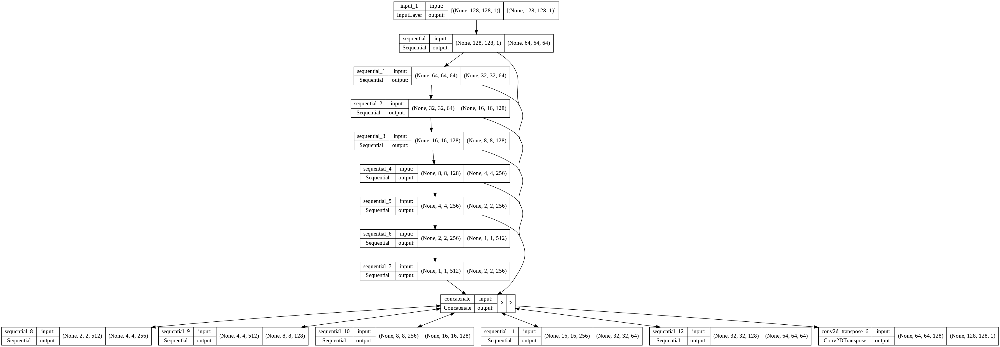

In [36]:
# Visualize generator model architecture
plot_model(generator_T1, show_shapes=True, show_layer_names=True)

In [37]:
generator_T2.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 128, 128, 1  0           []                               
                                )]                                                                
                                                                                                  
 sequential_13 (Sequential)     (None, 64, 64, 64)   1152        ['input_2[0][0]']                
                                                                                                  
 sequential_14 (Sequential)     (None, 32, 32, 64)   65664       ['sequential_13[0][0]']          
                                                                                                  
 sequential_15 (Sequential)     (None, 16, 16, 128)  131328      ['sequential_14[0][0]']    

### Discriminator
Discriminator is a traditional CNN, which we use to classify the images. Hence, it only uses Downsampling layers.

Both Discriminators have same architecture.

In [38]:
# Discriminators only contain Convolutional layers and no Transposed Convolution is used.
def discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)
    # add input layer of size (128, 128, 1)
    inp = tf.keras.layers.Input(shape=[128, 128, 1], name='input_image')
    x = inp
    
    # add downsampling step here
    down1 = downsample(64, 4, False)(x)                 # (bs, 64, 64, 64)
    down2_intermediate = downsample(128, 4)(down1)      # (bs, 32, 32, 128)
    down3_intermediate = downsample(256, 4)(down2_intermediate) # (bs, 16, 16, 256)
    down4 = downsample(512, 4)(down3_intermediate)      # (bs, 8, 8, 512)
    
    # Adding a zero-padding layer
    zero_pad1 = tf.keras.layers.ZeroPadding2D()(down4)  # (bs, 10, 10, 512)
    
    # implement a concrete downsampling layer here
    conv = tf.keras.layers.Conv2D(256, 4, strides=1, kernel_initializer=initializer,
                                  use_bias=False)(zero_pad1)  # (bs, 7, 7, 256)
    norm1 = InstanceNormalization()(conv)                     # (bs, 7, 7, 256)
    leaky_relu = tf.keras.layers.LeakyReLU()(norm1)           # (bs, 7, 7, 256)
    
    # Adding another zero padding layer
    zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)   # (bs, 9, 9, 256)
    
    # add a last pure 2D Convolution layer
    last = tf.keras.layers.Conv2D(1, 4, strides=1, kernel_initializer=initializer)(zero_pad2)   # (bs, 6, 6, 1 )
    
    return tf.keras.Model(inputs=inp, outputs=last)

In [39]:
# Defining discriminators
discriminator_T1 = discriminator()
discriminator_T2 = discriminator()

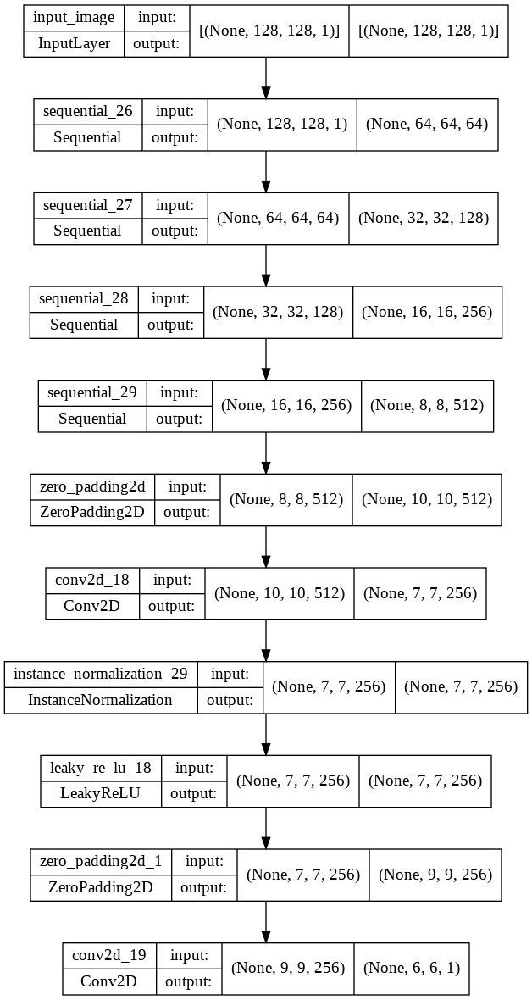

In [40]:
# Visualize discriminator model architecture
plot_model(discriminator_T1, show_shapes=True, show_layer_names=True)

In [41]:
discriminator_T2.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_image (InputLayer)    [(None, 128, 128, 1)]     0         
                                                                 
 sequential_30 (Sequential)  (None, 64, 64, 64)        1024      
                                                                 
 sequential_31 (Sequential)  (None, 32, 32, 128)       131328    
                                                                 
 sequential_32 (Sequential)  (None, 16, 16, 256)       524800    
                                                                 
 sequential_33 (Sequential)  (None, 8, 8, 512)         2098176   
                                                                 
 zero_padding2d_2 (ZeroPaddi  (None, 10, 10, 512)      0         
 ng2D)                                                           
                                                           

## Model Training
1. Declare Loss type
2. Calculate Discriminator Loss
3. Calculate Generator Loss
4. Cycle Loss
5. Identity Loss
6. Optimizer
7. Checkpoint Initialization
8. Training Flow

### Checking output of untrained generator

In [42]:
sample_T1_data = next(iter(T1_data))
sample_T2_data = next(iter(T2_data))

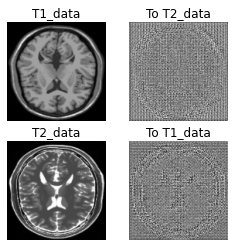

In [43]:
to_T2_data = generator_T2(sample_T1_data)   # Generating T2 from T1 data
to_T1_data = generator_T1(sample_T2_data)   # Generating T1 from T2 data

plt.figure(figsize=(4, 4))

imgs = [sample_T1_data, to_T2_data, sample_T2_data, to_T1_data]
title = ['T1_data', 'To T2_data', 'T2_data', 'To T1_data']

for i in range(len(imgs)):
    plt.subplot(2, 2, i+1)
    plt.title(title[i])
    plt.imshow(imgs[i][0].numpy()[:, :, 0], cmap='gray')
    plt.axis('off')
plt.show()

### Declare Loss as Binary Cross Entropy, since Our Discriminator is a classifier

In [44]:
loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True)

### Discriminator Loss
It consists of two types of losses
1.    Loss on Real Data
2.    Loss on Fake Data

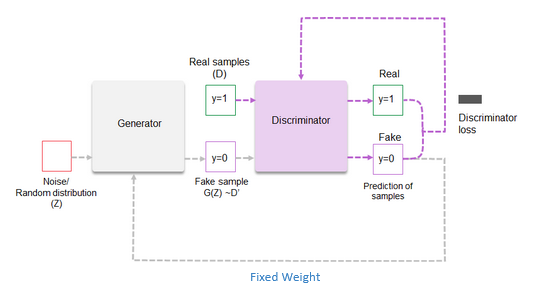

In [45]:
def discriminator_loss(real, generated):
    real_loss = loss_obj(tf.ones_like(real), real)
    generated_loss = loss_obj(tf.zeros_like(generated), generated)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss * 0.5      # mean of losses

### Generator Loss
It has only one type of loss - Discriminator Loss on Generated data

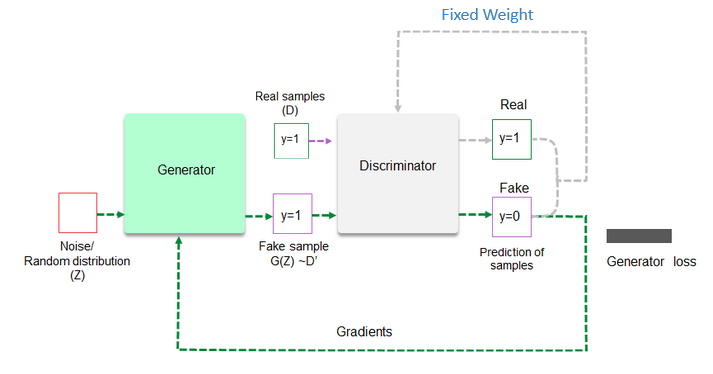

In [46]:
def generator_loss(generated):
    return loss_obj(tf.ones_like(generated), generated)

### Cycle Loss
When we use both of Generators sequentially on a Input Image, we get Cycle Image and the L1 Loss between these two is called Cycle Loss.

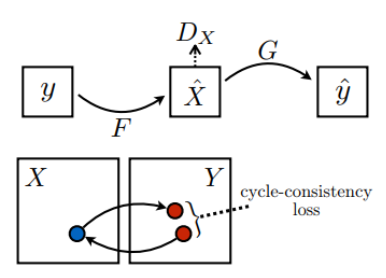

In [47]:
def calc_cycle_loss(real_image, cycled_image):
    cycle_loss = tf.reduce_mean(tf.abs(real_image - cycled_image))  # Averages out all values in the input
    return 10.0 * cycle_loss                                        # Weight of 10 used as contribution of cycle loss to total loss. This is a hyperparameter.

### Identity Loss
When we provide input image to the Generator such that no translation is needed because the image is already transformed, the difference should be minimal between original and generated image. Here also we take L1 Loss between input and output image.

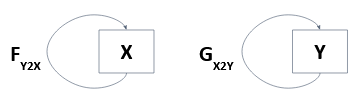

In [48]:
def identity_loss(real_image, same_image):
    id_loss = tf.reduce_mean(tf.abs(real_image - same_image))       # Averages out all values in the input
    return 2.0 * id_loss                                            # Weight of 2.0 used as contribution of identity loss to total loss. This is a hyperparameter.

### Optimizer definition.


In [49]:
generator_T1_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
generator_T2_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

discriminator_T1_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_T2_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

### Checkpoint Initialization
Initialize checkpoints to save models

In [50]:
# Directory to keep Checkpoints at each epoch
if not os.path.isdir('training_checkpoints'):
    os.mkdir('training_checkpoints')

checkpoint_path = "./training_checkpoints"

ckpt = tf.train.Checkpoint(generator_T1=generator_T1,
                           generator_T2=generator_T2,
                           discriminator_T1=discriminator_T1,
                           discriminator_T2=discriminator_T2,
                           generator_T1_optimizer=generator_T1_optimizer,
                           generator_T2_optimizer=generator_T2_optimizer,
                           discriminator_T1_optimizer=discriminator_T1_optimizer,
                           discriminator_T2_optimizer=discriminator_T2_optimizer)

ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=3)

# if a checkpoint exists, restore the latest checkpoint.
if ckpt_manager.latest_checkpoint:
    ckpt.restore(ckpt_manager.latest_checkpoint)
    print ('Latest checkpoint restored!!')

In [51]:
# Directory to keep Generated Images each epoch
if not os.path.isdir('generated_images'):
    os.mkdir('generated_images')

# Function to show Images output by Generators while Training
def generate_images(model1, test_input1, model2, test_input2, epoch):
    prediction1 = model1(test_input1)
    prediction2 = model2(test_input2)
    plt.figure(figsize=(4, 4))
    display_list = [test_input1[0], prediction1[0], test_input2[0], prediction2[0]]
    title = ['Input T1', 'Predicted T2 - Epoch ' + str(epoch), 'Input T2', 'Predicted T1 - Epoch ' + str(epoch)]
    for i in range(4):
        plt.subplot(2, 2, i+1)
        plt.title(title[i])
        plt.imshow(display_list[i].numpy()[:, :, 0], cmap='gray')
        plt.axis('off')

    plt.savefig('./generated_images/image_at_epoch_{:04d}.png'.format(epoch))
    plt.show()

### Training Flow
The function below performs one flow of batch training

Sequence of Training Flow

1.   Generate Fake T2 and Cycled T1
2.   Generate Fake T1 and Cycled T2
3.   Generate Fake Images through T1 and T2 for Identity Loss.
4.   Calculate Discriminator Loss for Disc T1 and Disc T2 on Fake Data for Generator Training.
5.   Calculate Generator Loss on Discriminator.
6.   Calculate Cycled Loss on Cycled Images from step 1 and 2.
7.   Calculate Total Generator Loss - Disc Loss + Cycled Loss + Identity Loss
8.   Calculate Discriminator Loss on both Fake and Real Images for Disc X and Y for Disc Training.
9.   Calculate the Gradients and update the weight and bias of models.

In [52]:
@tf.function
def train_step(real_T1, real_T2):
    # persistent is set to True because the tape is used more than once to calculate the gradients.
    with tf.GradientTape(persistent=True) as tape:
        # Generator T2 translates T1 -> T2
        # Generator T1 translates T2 -> T1
        fake_T2 = generator_T2(real_T1, training=True)
        cycled_T1 = generator_T1(fake_T2, training=True)
        
        fake_T1 = generator_T1(real_T2, training=True)
        cycled_T2 = generator_T2(fake_T1, training=True)
        
        # same_x and same_y are used for identity loss.
        same_T1 = generator_T1(real_T1, training=True)
        same_T2 = generator_T2(real_T2, training=True)
        
        disc_real_T1 = discriminator_T1(real_T1, training=True)
        disc_real_T2 = discriminator_T2(real_T2, training=True)
        
        disc_fake_T1 = discriminator_T1(fake_T1, training=True)
        disc_fake_T2 = discriminator_T2(fake_T2, training=True)
        
        # calculate generator loss
        gen_T2_loss = generator_loss(disc_fake_T2)
        gen_T1_loss = generator_loss(disc_fake_T1)
        
        # Calculate cycle loss
        total_cycle_loss = calc_cycle_loss(real_T1, cycled_T1) + calc_cycle_loss(real_T2, cycled_T2)
        
        # Total generator loss = BCE loss + cycle loss + identity loss
        total_gen_T1_loss = gen_T1_loss + total_cycle_loss + identity_loss(real_T1, same_T1)
        total_gen_T2_loss = gen_T2_loss + total_cycle_loss + identity_loss(real_T2, same_T2)
        
        # Discriminator's loss
        disc_T1_loss = discriminator_loss(disc_real_T1, disc_fake_T1)
        disc_T2_loss = discriminator_loss(disc_real_T2, disc_fake_T2)
        
    # Calculate the gradients for generator and discriminator
    generator_T1_gradients = tape.gradient(total_gen_T1_loss, generator_T1.trainable_variables)
    generator_T2_gradients = tape.gradient(total_gen_T2_loss, generator_T2.trainable_variables)
    
    discriminator_T1_gradients = tape.gradient(disc_T1_loss, discriminator_T1.trainable_variables)
    discriminator_T2_gradients = tape.gradient(disc_T2_loss, discriminator_T2.trainable_variables)
    
    # Apply the gradients to the optimizer
    generator_T1_optimizer.apply_gradients(zip(generator_T1_gradients, generator_T1.trainable_variables))
    generator_T2_optimizer.apply_gradients(zip(generator_T2_gradients, generator_T2.trainable_variables))
    
    discriminator_T1_optimizer.apply_gradients(zip(discriminator_T1_gradients, discriminator_T1.trainable_variables))
    discriminator_T2_optimizer.apply_gradients(zip(discriminator_T2_gradients, discriminator_T2.trainable_variables))

#### Train the CycleGAN Model for several Epochs
Loop training function for number of epochs and also show the output at each step.

In [53]:
for image_x in T1_data:
    for image_y in T2_data:
        print(image_x.shape, image_y.shape)

(43, 128, 128, 1) (46, 128, 128, 1)


In [54]:
# Declaring number of epochs of training
EPOCHS = 250

In [ ]:
# Training run - Epochs 1 to 250
for epoch in range(1, EPOCHS+1):
    for image_x in T1_data:
        for image_y in T2_data:
            train_step(image_x, image_y)
    generate_images(generator_T2, sample_T1_data, generator_T1, sample_T2_data, epoch)
    ckpt_save_path = ckpt_manager.save()
    print('Saving checkpoint for epoch', epoch, 'at', ckpt_save_path)

#### After 250 epochs, the results are pretty good. The predicted images have a good likeness to their respective input image in terms of content, while having the style of the other image type. 

- Predicted T2 has the features of input T1 in the style of T2.
- Predicted T1 has the features of input T2 in the style of T1.

### Generating a GIF for visualization of Results

In [56]:
anim_file = 'MRI_T1_T2_ver8.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
  filenames = glob.glob('./generated_images/image*.png')
  filenames = sorted(filenames)
  for filename in filenames:
    image = imageio.imread(filename)
    writer.append_data(image)
  image = imageio.imread(filename)
  writer.append_data(image)

In [57]:
!pip install git+https://github.com/tensorflow/docs

  Cloning https://github.com/tensorflow/docs to /tmp/pip-req-build-b_ek31yy
  Running command git clone -q https://github.com/tensorflow/docs /tmp/pip-req-build-b_ek31yy
  Created wheel for tensorflow-docs: filename=tensorflow_docs-0.0.0.dev0-py3-none-any.whl size=176021 sha256=a77fefa50040040f64ef8692f21b9303b9b601e6afe0bfd0666536864680eeb7
  Stored in directory: /tmp/pip-ephem-wheel-cache-de976kc0/wheels/cc/c4/d8/5341e93b6376c5c929c49469fce21155eb69cef1a4da4ce32c
Successfully built tensorflow-docs



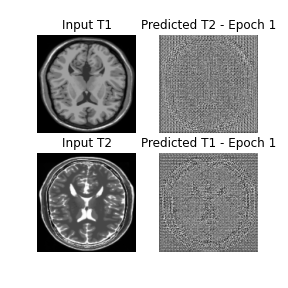

In [58]:
# Visualizing the progress from epoch to epoch 
import tensorflow_docs.vis.embed as embed
embed.embed_file(anim_file)

### Conclusion
- We can see that a Cycle GAN architecture is effective in translating the style of T1 weighted MRI images to T2 weighted MRI image inputs, and vice versa.
- This can be very useful in more effective diagnosis, without the need of a second MRI scan. This not only saves time for the doctors, but would also reduce the financial burden on the patients.

#### End of Project